<a href="https://colab.research.google.com/github/riccardoAlbertoni/ISWC_reproducibility607/blob/master/Reproducing607.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Checking the reproducibility line of Assessment
 
List of checks successfully reproduced in this Colab notebook following the istruction in explained in 
[1] https://github.com/ISWC-Reproducibility-Track/Paper_607/blob/master/ISWC2020_paper_607.pdf

**System:**
*   How to obtain  the system?  **(OK)**
*   How to configure the environment if need be (e.g., environment variables, paths)? **(N/A, not critical, just usual classpath, perhaps it could be made explicit the use of -cp for including the target?)**
* How to compile the system? (existing compilation options should be mentioned and why they are needed) **(OK Java and Maven)**
* How to use the system? (What are the configuration options and parameters to the system and where to set them?) **(OK)**
* How to make sure that the system is installed correctly? **(OK)**

**Software Reproducibility:**
* I am not sure If I can and how to install docker in colab. The workaround was to work on my laptop for this part.
* I've tried to run the server locally on my laptop following the instructions available at https://oba.readthedocs.io/en/latest/server/ . See the related section, for local test on my laptop I grabbed a couple of screenshot to give an idea of what was happening. However, it does not seems to work as expected. 



#Installing software 

In [ ]:
#cancelling the directory
#!rm  -rf OBA/

## Cloning the project




In [ ]:
#This is the original sw repository not the zip submited for the review. However istructions in the submission point to this, rather than to the zip. So I have used it. 
!git clone https://github.com/KnowledgeCaptureAndDiscovery/OBA.git


Cloning into 'OBA'...
remote: Enumerating objects: 331, done.
remote: Counting objects: 100% (331/331), done.
remote: Compressing objects: 100% (193/193), done.
remote: Total 2298 (delta 168), reused 231 (delta 110), pack-reused 1967
Receiving objects: 100% (2298/2298), 25.81 MiB | 25.29 MiB/s, done.
Resolving deltas: 100% (1052/1052), done.


## Installing JAVA

In [ ]:
!apt-get install openjdk-8-jdk-headless -qq > /dev/null


## Installing Maven

In [ ]:
!apt-get install maven  -qq > /dev/null

## Compiling & Building

In [ ]:
!cd OBA; mvn package 



Streaming output truncated to the last 5000 lines.
[INFO] org/apache/http/impl/AbstractHttpServerConnection.class already added, skipping
[INFO] org/apache/http/impl/BHttpConnectionBase.class already added, skipping
[INFO] org/apache/http/impl/ConnSupport.class already added, skipping
[INFO] org/apache/http/impl/DefaultBHttpClientConnection.class already added, skipping
[INFO] org/apache/http/impl/DefaultBHttpClientConnectionFactory.class already added, skipping
[INFO] org/apache/http/impl/DefaultBHttpServerConnection.class already added, skipping
[INFO] org/apache/http/impl/DefaultBHttpServerConnectionFactory.class already added, skipping
[INFO] org/apache/http/impl/DefaultConnectionReuseStrategy.class already added, skipping
[INFO] org/apache/http/impl/DefaultHttpClientConnection.class already added, skipping
[INFO] org/apache/http/impl/DefaultHttpRequestFactory.class already added, skipping
[INFO] org/apache/http/impl/DefaultHttpResponseFactory.class already added, skipping
[INFO] o

## Is the system installed correctly?

In [ ]:
#Yes it asks for the configuration path as expected 
!  cd OBA; java -cp "target" -jar target/oba-3.4.0-jar-with-dependencies.jar 

Missing required option: c
usage: utiConfiguration filelity-name
 -c,--config <arg>   configuration file path


#Starting actual testing



###Generating OpenAPI for ModelCatalog 

In [ ]:
!  cd OBA; java -cp "target" -jar target/oba-3.4.0-jar-with-dependencies.jar -c examples/modelcatalog_reduced/config.yaml


[2020-10-09 14:57:24] [SEVERE ] null 
outputs/modelcatalog-reduced/ontology0.owl
[main] WARN org.semanticweb.owlapi.util.SAXParsers - http://www.oracle.com/xml/jaxp/properties/entityExpansionLimit not supported by parser type org.apache.xerces.jaxp.SAXParserImpl, error message: Property 'http://www.oracle.com/xml/jaxp/properties/entityExpansionLimit' is not recognized.
[main] WARN org.semanticweb.owlapi.util.SAXParsers - entityExpansionLimit not supported by parser type org.apache.xerces.jaxp.SAXParserImpl, error message: Property 'entityExpansionLimit' is not recognized.
[main] WARN org.semanticweb.owlapi.util.SAXParsers - http://www.oracle.com/xml/jaxp/properties/entityExpansionLimit not supported by parser type org.apache.xerces.jaxp.SAXParserImpl, error message: Property 'http://www.oracle.com/xml/jaxp/properties/entityExpansionLimit' is not recognized.
[main] WARN org.semanticweb.owlapi.util.SAXParsers - entityExpansionLimit not supported by parser type org.apache.xerces.jaxp.SAXP

#### The openAPI definition is created 
 Output available at OBA/outputs/modelcatalog-reduced/servers

---



In [ ]:
#!cd OBA/; dir;
!cd OBA/outputs/modelcatalog-reduced/servers; ls -lsa;
#!less OBA/outputs/modelcatalog-reduced/servers/README.txt ;

total 8980
   4 drwxr-xr-x 3 root root    4096 Oct  9 14:57 .
   4 drwxr-xr-x 4 root root    4096 Oct  9 14:57 ..
   4 -rw-r--r-- 1 root root    2008 Oct  9 14:57 context_class.json
  12 -rw-r--r-- 1 root root   11533 Oct  9 14:57 context.json
  64 -rw-r--r-- 1 root root   62923 Oct  9 14:57 openapi.yaml
8884 -rw-r--r-- 1 root root 9095813 Oct  9 14:57 owl2jsonld-0.3.0-SNAPSHOT-standalone.jar
   4 drwxr-xr-x 3 root root    4096 Oct  9 14:57 python
   4 -rw-r--r-- 1 root root      63 Oct  9 14:57 README.txt


Downloading the generated openapi.yalm,so that, I test this with https://editor.swagger.io/

In [ ]:
from google.colab import files
files.download('OBA/outputs/modelcatalog-reduced/servers/openapi.yaml') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Some errors when loading the file in https://editor.swagger.io/, probably related to self references, I am assuming they are not a problem. 


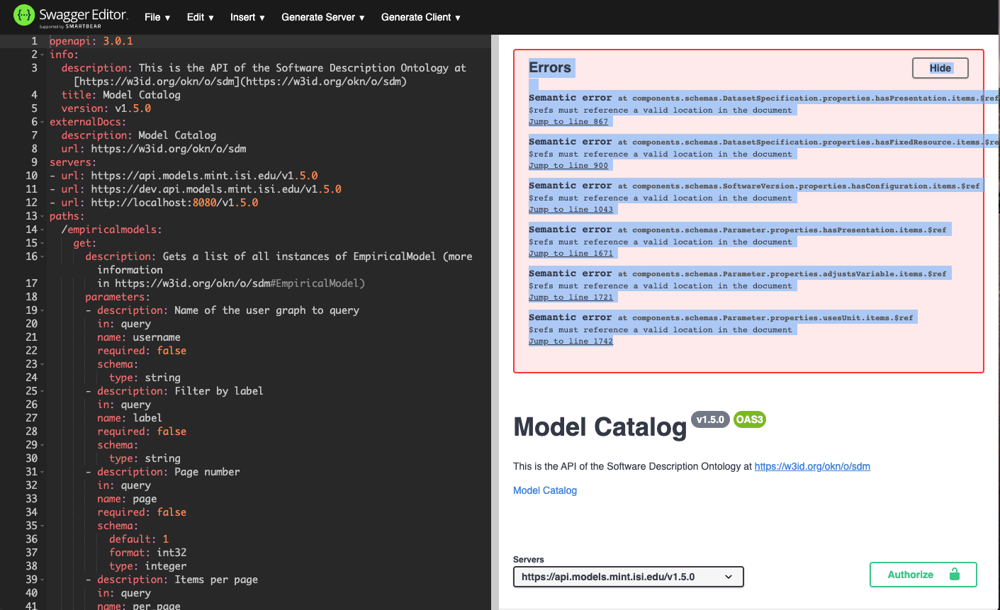



### Generated  OpenAPI for DBpedia music

In [ ]:
#! ls -lsa OBA/examples/dbpedia/
!  cd OBA; java -cp "target" -jar target/oba-3.4.0-jar-with-dependencies.jar -c examples/dbpedia/config_music.yaml

outputs/dbpedia_music/ontology0.owl
[main] WARN org.semanticweb.owlapi.util.SAXParsers - http://www.oracle.com/xml/jaxp/properties/entityExpansionLimit not supported by parser type org.apache.xerces.jaxp.SAXParserImpl, error message: Property 'http://www.oracle.com/xml/jaxp/properties/entityExpansionLimit' is not recognized.
[main] WARN org.semanticweb.owlapi.util.SAXParsers - entityExpansionLimit not supported by parser type org.apache.xerces.jaxp.SAXParserImpl, error message: Property 'entityExpansionLimit' is not recognized.
[main] INFO org.semanticweb.owlapi.rdf.rdfxml.parser.TripleHandlers - Usage of rdf vocabulary: http://dbpedia.org/ontology/politicalPartyOfLeader -> http://www.w3.org/1999/02/22-rdf-syntax-ns#type -> http://www.w3.org/1999/02/22-rdf-syntax-ns#Property
[main] INFO org.semanticweb.owlapi.rdf.rdfxml.parser.TripleHandlers - Usage of rdf vocabulary: http://dbpedia.org/ontology/distanceLaps -> http://www.w3.org/1999/02/22-rdf-syntax-ns#type -> http://www.w3.org/1999/0

#### The openAPI definition is created 
 Output available at OBA/outputs/dbpedia_music/servers/


In [ ]:
#!cd OBA/; dir;
!cd OBA/outputs/dbpedia_music/servers/; ls -lsa;
#!less OBA/outputs/dbpedia_music/servers/README.txt ;

total 9460
   4 drwxr-xr-x 3 root root    4096 Oct  9 14:58 .
   4 drwxr-xr-x 4 root root    4096 Oct  9 14:58 ..
  56 -rw-r--r-- 1 root root   55718 Oct  9 14:58 context_class.json
 488 -rw-r--r-- 1 root root  496521 Oct  9 14:58 context.json
  16 -rw-r--r-- 1 root root   15160 Oct  9 14:58 openapi.yaml
8884 -rw-r--r-- 1 root root 9095813 Oct  9 14:58 owl2jsonld-0.3.0-SNAPSHOT-standalone.jar
   4 drwxr-xr-x 3 root root    4096 Oct  9 14:58 python
   4 -rw-r--r-- 1 root root      63 Oct  9 14:58 README.txt


Downloading the generated openapi.yalm,so that, I test this with https://editor.swagger.io/

In [ ]:
from google.colab import files
files.download('OBA/outputs/dbpedia_music/servers/openapi.yaml') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

The generated OpenAPI visualized by https://editor.swagger.io/

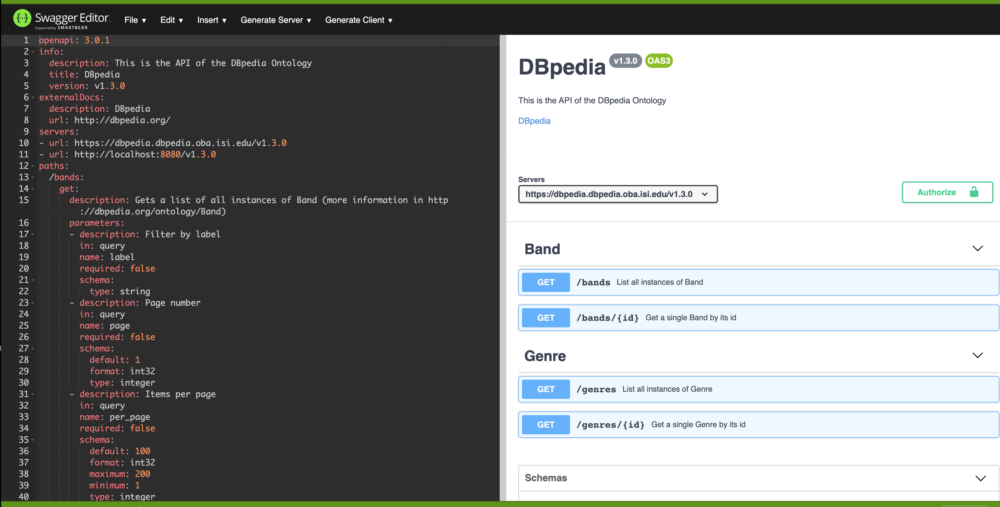

## Running JUNIT tests

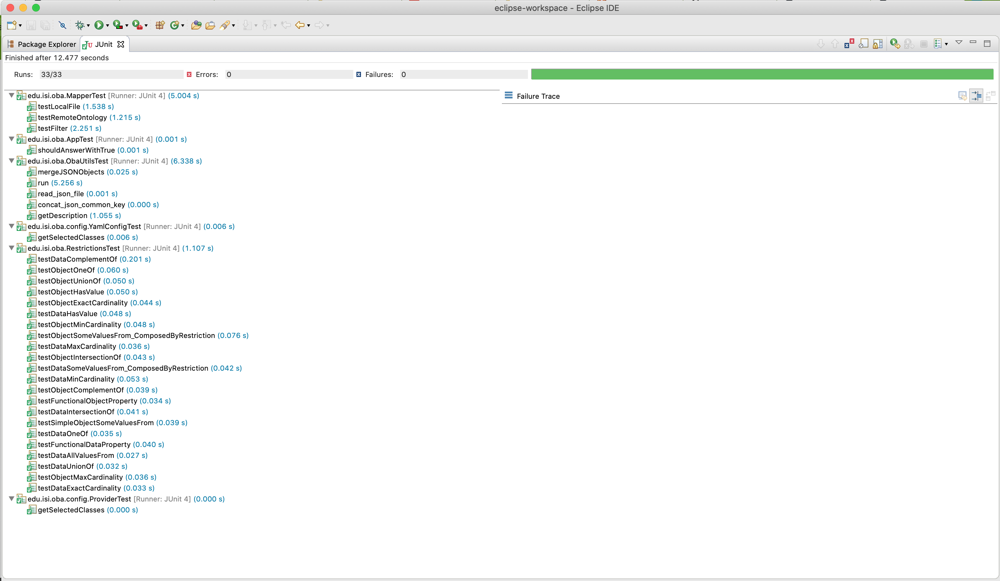

### Testing the server

I tried to run the server in Colab, but I am not sure Docker can be used in this context. See some attempts of installing docker below

In [ ]:
!sudo apt update
!sudo apt install docker

Ign:1 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Hit:2 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease
Ign:3 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Hit:4 http://security.ubuntu.com/ubuntu bionic-security InRelease
Hit:5 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease
Hit:6 http://archive.ubuntu.com/ubuntu bionic InRelease
Hit:7 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release
Hit:8 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Hit:9 http://archive.ubuntu.com/ubuntu bionic-updates InRelease
Hit:10 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu bionic InRelease
Hit:11 http://archive.ubuntu.com/ubuntu bionic-backports InRelease
Reading package lists... Done
Building dependency tree       
Reading state information... Done
11 packages can be upgraded. Run '

In [ ]:
! docker

/bin/bash: docker: command not found


In [ ]:
!cd outputs/modelcatalog-reduced/servers/python ; bash generate-server.sh    


/bin/bash: line 0: cd: outputs/modelcatalog-reduced/servers/python: No such file or directory
bash: generate-server.sh: No such file or directory


## Testing of the server (Locally on my laptop) 
following instruction at https://oba.readthedocs.io/en/latest/server/





### Zipping and Downloading the compiled version and the generated  yaml 

AFAIK Docker is not supported by COlab (see https://stackoverflow.com/questions/62238690/running-docker-on-google-colab),  so I am testing the server locally on my laptop.

In [ ]:
# Zipping the files created so far
!zip -r OBAzipped.zip OBA/
!ls -lsa

  adding: OBA/ (stored 0%)
  adding: OBA/.release-it.json (deflated 48%)
  adding: OBA/benchmark/ (stored 0%)
  adding: OBA/benchmark/endpoint_50qps.html (deflated 73%)
  adding: OBA/benchmark/endpoint_50qps.png (deflated 33%)
  adding: OBA/benchmark/api_50qps.png (deflated 43%)
  adding: OBA/benchmark/api_50qps.html (deflated 73%)
  adding: OBA/target/ (stored 0%)
  adding: OBA/target/maven-archiver/ (stored 0%)
  adding: OBA/target/maven-archiver/pom.properties (deflated 2%)
  adding: OBA/target/generated-sources/ (stored 0%)
  adding: OBA/target/generated-sources/annotations/ (stored 0%)
  adding: OBA/target/generated-sources/test-annotations/ (stored 0%)
  adding: OBA/target/oba-3.4.0.jar (deflated 0%)
  adding: OBA/target/classes/ (stored 0%)
  adding: OBA/target/classes/README.txt (stored 0%)
  adding: OBA/target/classes/edu/ (stored 0%)
  adding: OBA/target/classes/edu/isi/ (stored 0%)
  adding: OBA/target/classes/edu/isi/oba/ (stored 0%)
  adding: OBA/target/classes/edu/isi/oba

In [ ]:

#Downloading the zip file
from google.colab import files
files.download("OBAzipped.zip")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Generating the server


In [ ]:
!cd outputs/dbpedia_music/servers/python/
! bash generate-server.sh

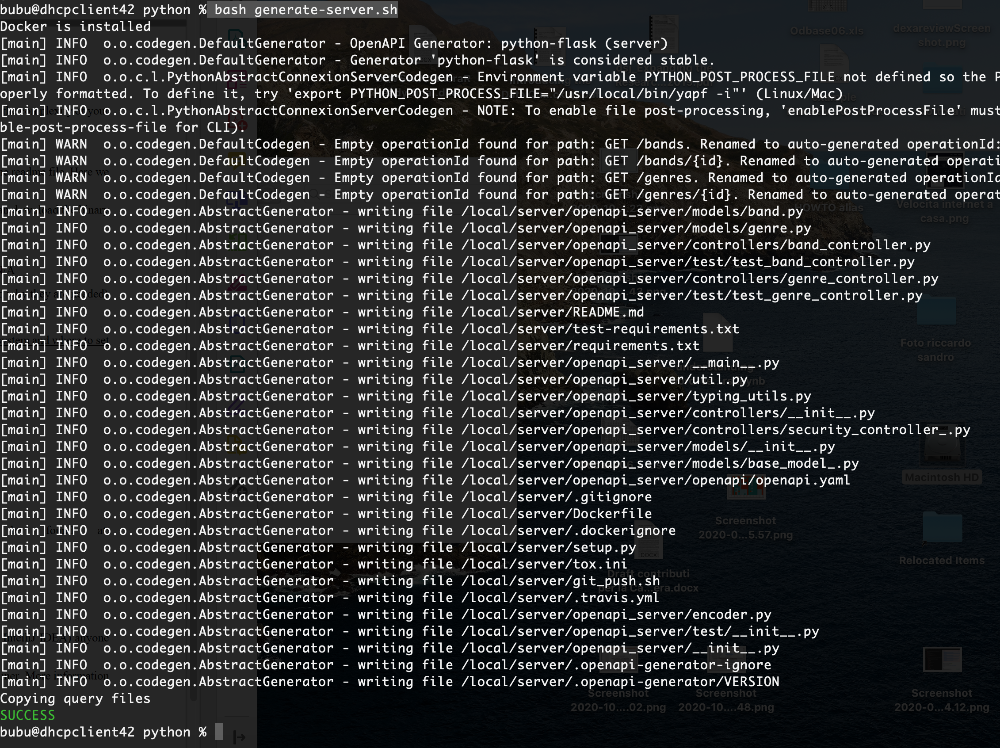

### Building the image

In [ ]:
!cd server
# building the image
! docker build -t openapi_server .


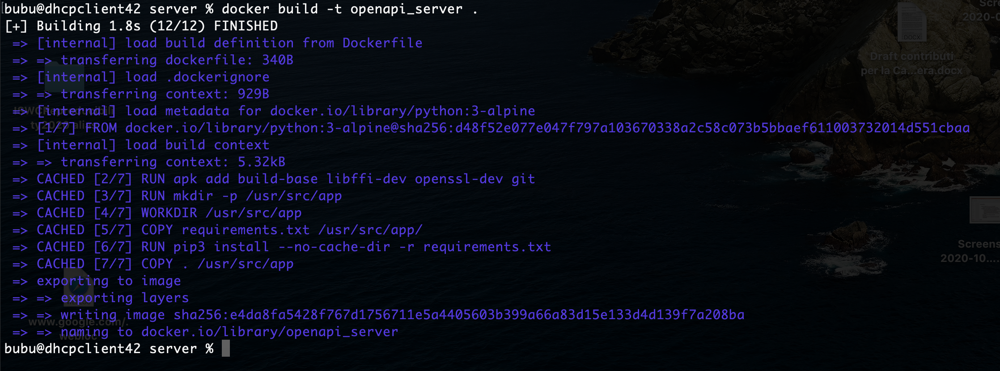

### Starting up a container (not working as exected?!?)

In [ ]:
# starting up a container
!  docker run -v $PWD/openapi_server/openapi/:/usr/src/app/openapi_server/openapi/ <docker_image>

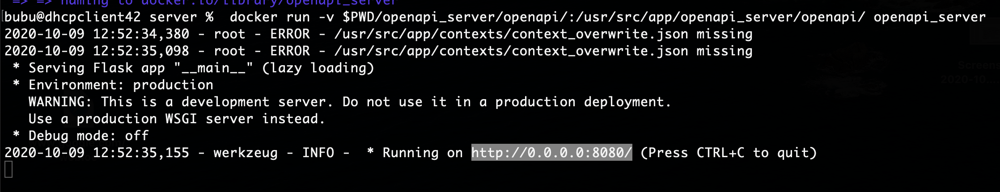

**I tried to access http://0.0.0.0:8080, but there is nothing running there, nor in localhost. Did I make any mistakes? Any suggestions?**